# ## 1. Setup

In [1]:
# Imports, global constants and visualization settings.

import glob
import os
import gc
import time
import joblib
import numpy as np
import pandas as pd
from tqdm import tqdm
from collections import Counter

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

import matplotlib.pyplot as plt
import seaborn as sns

from catboost import CatBoostClassifier
import lightgbm as lgb
import xgboost as xgb

In [2]:
# -----------------------------
# Global configuration
# -----------------------------
# DATA_PATH    = "/kaggle/input/unb-cic-iot-dataset/wataiData/csv/CICIoT2023"
DATA_PATH    = r"C:\Users\ss160\Desktop\My_Code\PycharmProjects\Ciciot23_practical\dataset\wataiData\csv\CICIoT2023"
LABEL_COL    = "label"
TARGET_ROWS  = 5_000_000
MIN_SAMPLES  = 1_000
RANDOM_STATE = 42
CHUNK_SIZE   = 2_000_000
SUBSAMPLE_N  = 200_000  # for feature-selection subset

# Figure/save settings
SAVE_DIR = "figures_multi"
FIG_DPI  = 600
os.makedirs(SAVE_DIR, exist_ok=True)

sns.set_style("whitegrid")
np.random.seed(RANDOM_STATE)

def _sanitize_name(s: str) -> str:
    return s.strip().lower().replace(" ", "_").replace("/", "_")

# ## 2. Compute Original Label Distribution

In [3]:
# Read all CSVs in chunks, count each label, and plot the overall imbalance.

# 2.1 get list of all part-*.csv files
csv_files = sorted(glob.glob(f"{DATA_PATH}/part-*.csv"))
assert csv_files, f"No files found in {DATA_PATH}"

# 2.2 read header to list all feature columns
header_df = pd.read_csv(csv_files[0], nrows=0)
ALL_FEATURES = [c for c in header_df.columns if c != LABEL_COL]

# 2.3 count labels over all files
label_counts = Counter()
for path in tqdm(csv_files, desc="Counting labels"):
    for chunk in pd.read_csv(path, usecols=[LABEL_COL], chunksize=CHUNK_SIZE):
        label_counts.update(chunk[LABEL_COL].values)

total_rows = sum(label_counts.values())
print(f"Total rows found: {total_rows:,}")
print("Top label counts (sample):")
print(label_counts.most_common(10))

Counting labels: 100%|██████████| 169/169 [00:39<00:00,  4.25it/s]

Total rows found: 46,686,579
Top label counts (sample):
[('DDoS-ICMP_Flood', 7200504), ('DDoS-UDP_Flood', 5412287), ('DDoS-TCP_Flood', 4497667), ('DDoS-PSHACK_Flood', 4094755), ('DDoS-SYN_Flood', 4059190), ('DDoS-RSTFINFlood', 4045285), ('DDoS-SynonymousIP_Flood', 3598138), ('DoS-UDP_Flood', 3318595), ('DoS-TCP_Flood', 2671445), ('DoS-SYN_Flood', 2028834)]


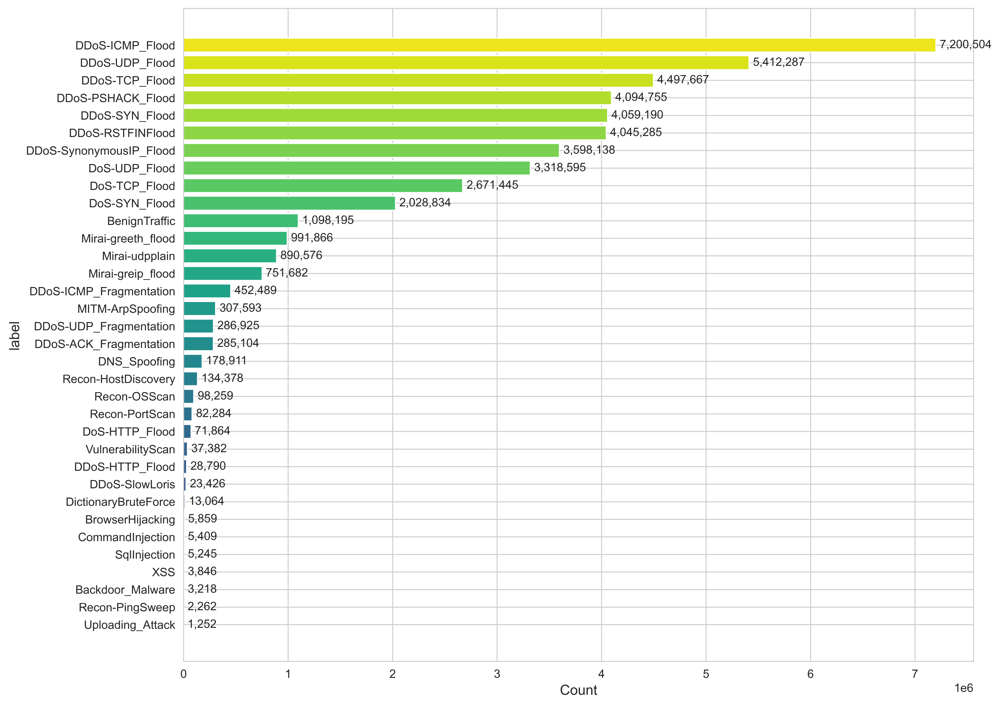

In [4]:
# Plot helper for horizontal bar counts (high-res + save JPEG, no title)

def plot_counts(counts_dict, filename, palette="viridis"):
    """Horizontal bar chart, adaptive height, no title, save as JPEG (dpi=FIG_DPI)."""
    series = pd.Series(counts_dict).sort_values()
    n = len(series)
    # Set figure height proportional to n (min 4, max grows)
    fig_h = max(4, 0.25 * n)
    fig_w = 12
    fig, ax = plt.subplots(figsize=(fig_w, fig_h), dpi=FIG_DPI)
    colors = sns.color_palette(palette, n)
    ax.barh(series.index, series.values, color=colors)
    maxv = series.max()
    for i, v in enumerate(series.values):
        ax.text(v + maxv * 0.005, i, f"{v:,}", va="center", fontsize=10)
    ax.set_xlabel("Count", fontsize=12)
    ax.set_ylabel(LABEL_COL, fontsize=12)
    # no title
    plt.tight_layout()
    out_path = os.path.join(SAVE_DIR, filename)
    plt.savefig(out_path, format="jpeg", dpi=FIG_DPI, bbox_inches='tight', pad_inches=0.02)
    plt.show()
    plt.close(fig)


# plot and save full original distribution
plot_counts(label_counts, "original_label_distribution.jpeg", palette="viridis")

# ## 3. Stratified Undersampling

Example target counts (first 10):
{'DDoS-RSTFINFlood': 433238, 'DoS-TCP_Flood': 286104, 'DDoS-ICMP_Flood': 771153, 'DoS-UDP_Flood': 355412, 'DoS-SYN_Flood': 217282, 'Mirai-greeth_flood': 106226, 'DDoS-SynonymousIP_Flood': 385350, 'Mirai-udpplain': 95378, 'DDoS-SYN_Flood': 434727, 'DDoS-PSHACK_Flood': 438536}


Undersampling files:  81%|████████  | 137/169 [01:08<00:16,  2.00it/s]
C:\Users\ss160\AppData\Local\Temp\ipykernel_29660\2877582432.py:41: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.sample(frac=frac, random_state=RANDOM_STATE))


→ Final sample size: 4,999,998


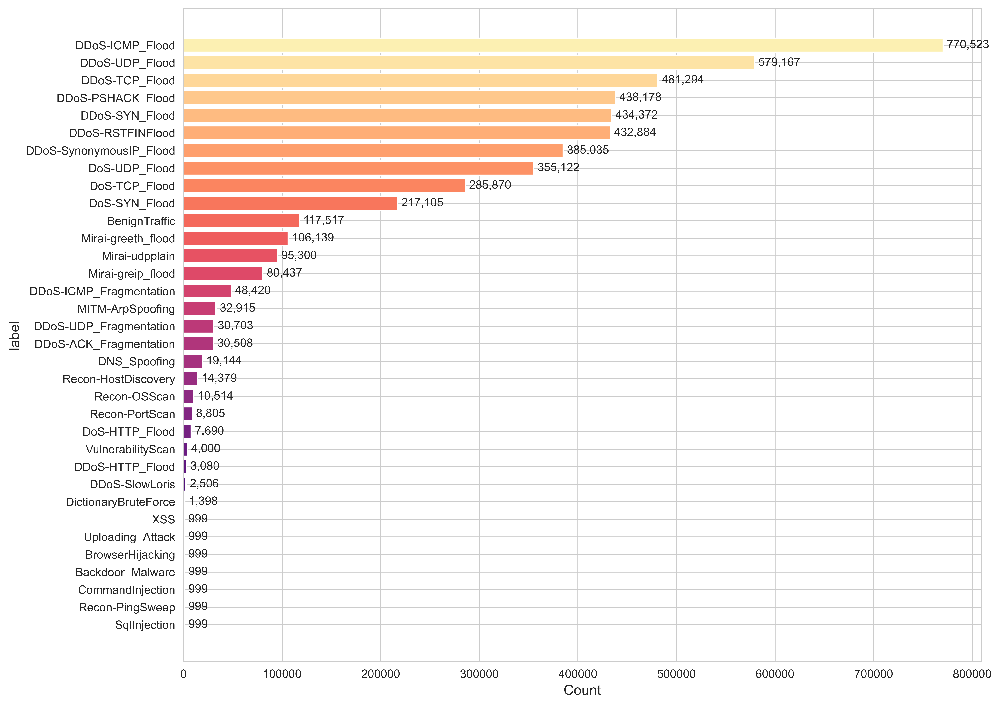

In [5]:
# pick exactly TARGET_ROWS stratified across labels, respecting a minimum per class.

# 3.1 compute how many samples per class (scaled proportionally then clipped to MIN_SAMPLES)
scaled = {lbl: max(1, int(cnt * TARGET_ROWS / total_rows)) for lbl, cnt in label_counts.items()}
target_counts = {lbl: max(MIN_SAMPLES, scaled[lbl]) for lbl in label_counts}

print("Example target counts (first 10):")
print(dict(list(target_counts.items())[:10]))

# 3.2 loop through chunks picking required samples
remaining = target_counts.copy()
selected_parts = []

for path in tqdm(csv_files, desc="Undersampling files"):
    if all(v <= 0 for v in remaining.values()):
        break
    for chunk in pd.read_csv(path, chunksize=CHUNK_SIZE):
        if all(v <= 0 for v in remaining.values()):
            break
        interested = [lbl for lbl, n in remaining.items() if n > 0]
        sub = chunk[chunk[LABEL_COL].isin(interested)]
        if sub.empty:
            continue
        for lbl, need in list(remaining.items()):
            if need <= 0:
                continue
            idx = sub.index[sub[LABEL_COL] == lbl].to_numpy()
            if idx.size == 0:
                continue
            take = min(need, len(idx))
            chosen = np.random.choice(idx, size=take, replace=False)
            selected_parts.append(chunk.loc[chosen])
            remaining[lbl] -= take

# 3.3 build DataFrame and enforce exact size (if slightly over)
reduced_df = pd.concat(selected_parts, ignore_index=True)
if len(reduced_df) > TARGET_ROWS:
    frac = TARGET_ROWS / len(reduced_df)
    reduced_df = (reduced_df
                  .groupby(LABEL_COL, group_keys=False)
                  .apply(lambda g: g.sample(frac=frac, random_state=RANDOM_STATE))
                  .reset_index(drop=True))

print(f"→ Final sample size: {len(reduced_df):,}")

# plot reduced distribution
plot_counts(reduced_df[LABEL_COL].value_counts().to_dict(),
            "reduced_label_distribution.jpeg",
            palette="magma")

# ## 4. Feature Selection (LightGBM)

C:\Users\ss160\AppData\Local\Programs\Python\Python311\Lib\site-packages\lightgbm\callback.py:347: UserWarning: Only training set found, disabling early stopping.
  _log_warning("Only training set found, disabling early stopping.")


[50]	training's multi_logloss: 16.5547
[100]	training's multi_logloss: 16.5547
→ Selected 23 / 46 features


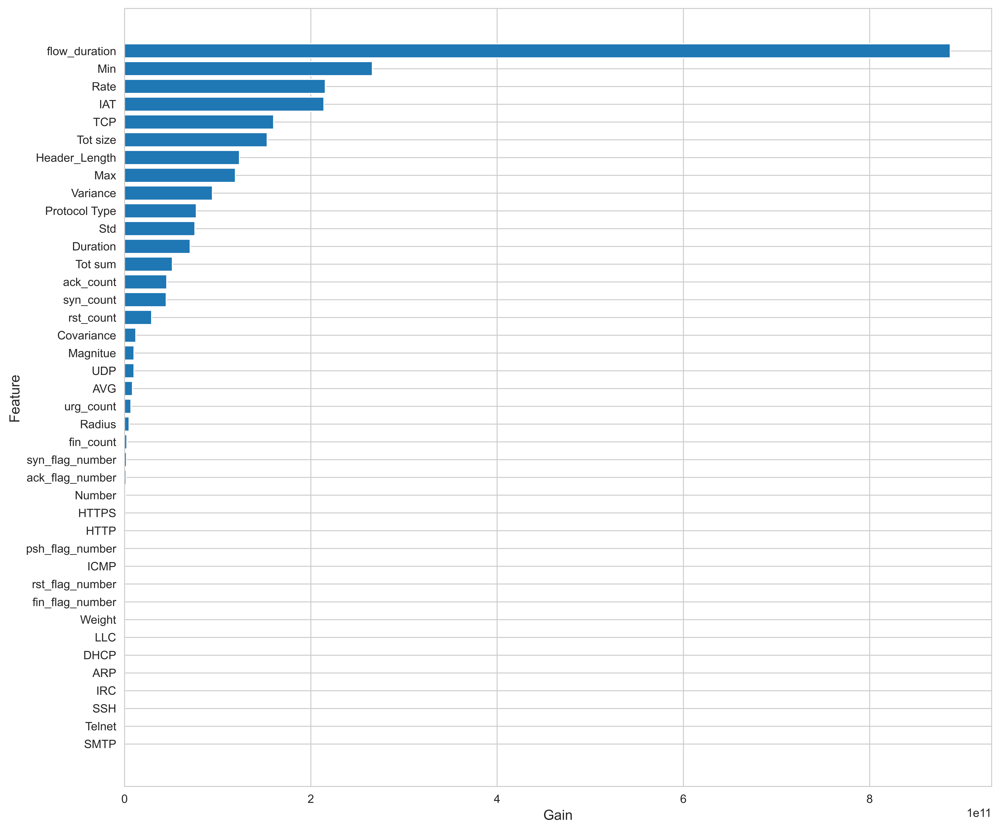

In [6]:
# sample SUBSAMPLE_N from reduced_df, map classes to ints, train LGBM for gain-based feature importance.

# 4.1 subsample
fs_df = reduced_df.sample(n=min(len(reduced_df), SUBSAMPLE_N), random_state=RANDOM_STATE)

# 4.2 map labels to integers (sorted for deterministic mapping)
unique_labels = sorted(label_counts.keys())
label_map = {lbl: i for i, lbl in enumerate(unique_labels)}
fs_df["y_num"] = fs_df[LABEL_COL].map(label_map)

# 4.3 prepare LightGBM dataset
X_fs = fs_df[ALL_FEATURES]
y_fs = fs_df["y_num"]
lgb_train = lgb.Dataset(X_fs, label=y_fs, free_raw_data=False)

# 4.4 train for feature-importance
fs_params = {
    "objective": "multiclass",
    "num_class": len(label_map),
    "learning_rate": 0.1,
    "num_leaves": 31,
    "min_data_in_leaf": 100,
    "verbosity": -1,
    "seed": RANDOM_STATE,
}
fs_model = lgb.train(fs_params, lgb_train, num_boost_round=100,
                     valid_sets=[lgb_train],
                     callbacks=[lgb.early_stopping(10), lgb.log_evaluation(50)])

# 4.5 pick features whose gain > median
imp = pd.Series(fs_model.feature_importance("gain"), index=ALL_FEATURES)
thr = imp.median()
selected_feats = imp[imp > thr].index.tolist()
print(f"→ Selected {len(selected_feats)} / {len(ALL_FEATURES)} features")


# Save feature importance figure (bar) as well
def save_feature_importance(series_imp, filename="feature_importance.jpeg", top_n=50):
    series_imp = series_imp.sort_values(ascending=True)
    if top_n is not None:
        series_imp = series_imp[-top_n:]
    fig_h = max(4, 0.25 * len(series_imp))
    fig, ax = plt.subplots(figsize=(12, fig_h), dpi=FIG_DPI)
    ax.barh(series_imp.index, series_imp.values)
    ax.set_xlabel("Gain", fontsize=12)
    ax.set_ylabel("Feature", fontsize=12)
    plt.tight_layout()
    out_path = os.path.join(SAVE_DIR, filename)
    plt.savefig(out_path, format="jpeg", dpi=FIG_DPI, bbox_inches='tight', pad_inches=0.02)
    plt.show()
    plt.close(fig)


save_feature_importance(imp, filename="feature_importance_all_gain.jpeg", top_n=40)

# ## 5. Train/Test Split & Preprocessing

In [7]:
# Build X/y, stratified split, standardize, compute sample weights; prepare class names for reporting.

# 5.1 filter and map
reduced_df = reduced_df[reduced_df[LABEL_COL].isin(label_map)]
y_full = reduced_df[LABEL_COL].map(label_map).values
X_full = reduced_df[selected_feats].values

# 5.2 train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X_full, y_full, test_size=0.2, stratify=y_full, random_state=RANDOM_STATE
)

# 5.3 standardize
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# 5.4 sample-weight computation (balanced)
train_counts = Counter(y_train)
n_classes = len(label_map)
spw = [len(y_train) / (n_classes * train_counts[c]) for c in range(n_classes)]
wts = [spw[label] for label in y_train]

# Prepare class names for reporting (ordered by label_map value)
classes = [lbl for lbl, _ in sorted(label_map.items(), key=lambda x: x[1])]

In [8]:
def save_classification_report_as_image(report_text: str, model_name: str, line_spacing: float = 0.12):
    """
    Save classification_report text as a compressed JPEG image with minimal white space.
    The numbers in report_text should be formatted with digits=4 before calling this function.
    """
    lines = report_text.strip().split("\n")
    if not lines:
        return
    max_line_len = max(len(line) for line in lines)
    # width per character and height per line are empirical; tune if needed
    fig_w = max(6, max_line_len * 0.067)  # scale factor chosen to make monospace readable
    fig_h = max(1.5, len(lines) * 0.32 * (line_spacing + 0.02) )
    fig, ax = plt.subplots(figsize=(fig_w, fig_h), dpi=FIG_DPI)
    ax.axis('off')
    ax.text(0, 1, report_text, fontsize=8, va='top', ha='left', family='monospace')
    out_name = f"classification_report_{_sanitize_name(model_name)}.jpeg"
    out_path = os.path.join(SAVE_DIR, out_name)
    plt.savefig(out_path, format="jpeg", dpi=FIG_DPI, bbox_inches='tight', pad_inches=0.01)
    plt.show()
    plt.close(fig)


def save_confusion_matrix(cm, model_name, classes, cmap="Blues"):
    """
    Save confusion matrix as high-res JPEG, no title, compact layout.
    """
    n = len(classes)
    # set square-ish figure; increase for many classes
    base = max(10, n * 0.3)
    fig, ax = plt.subplots(figsize=(base, base), dpi=FIG_DPI)
    cax = ax.matshow(cm, cmap=cmap)
    fig.colorbar(cax)
    ax.set_xticks(range(n))
    ax.set_yticks(range(n))
    ax.set_xticklabels(classes, rotation=90, fontsize=max(6, int(300 / FIG_DPI)))
    ax.set_yticklabels(classes, fontsize=max(6, int(300 / FIG_DPI)))
    # annotate counts
    for (i, j), v in np.ndenumerate(cm):
        ax.text(j, i, f"{v:,}", ha="center", va="center", fontsize=max(5, int(300 / FIG_DPI)))
    ax.set_xlabel("Predicted", fontsize=10)
    ax.set_ylabel("True", fontsize=10)
    plt.tight_layout()
    out_name = f"confusion_matrix_{_sanitize_name(model_name)}.jpeg"
    out_path = os.path.join(SAVE_DIR, out_name)
    plt.savefig(out_path, format="jpeg", dpi=FIG_DPI, bbox_inches='tight', pad_inches=0.02)
    plt.show()
    plt.close(fig)

# ## 6. Advanced Gradient-Boosting Models: Training & Evaluation
## Train and evaluate three multiclass gradient-boosting classifiers—XGBoost, CatBoost, LightGBM.


# ### 6.1 XGBoost
## histogram method and in-constructor early stopping (if GPU available)

C:\Users\ss160\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\training.py:183: UserWarning: [18:53:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "predictor", "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[0]	validation_0-mlogloss:1.93262
[50]	validation_0-mlogloss:0.03505
[100]	validation_0-mlogloss:0.02190
[150]	validation_0-mlogloss:0.01955
[200]	validation_0-mlogloss:0.01848
[250]	validation_0-mlogloss:0.01799
[300]	validation_0-mlogloss:0.01777
[350]	validation_0-mlogloss:0.01772
[400]	validation_0-mlogloss:0.01779
[450]	validation_0-mlogloss:0.01788
[499]	validation_0-mlogloss:0.01800


C:\Users\ss160\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\core.py:729: UserWarning: [19:00:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\common\error_msg.cc:58: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.

  return func(**kwargs)


XGBoost Accuracy: 0.994675
                         precision    recall  f1-score   support

       Backdoor_Malware     0.7597    0.5850    0.6610       200
          BenignTraffic     0.9313    0.9578    0.9444     23503
       BrowserHijacking     0.8542    0.6150    0.7151       200
       CommandInjection     0.8824    0.5250    0.6583       200
 DDoS-ACK_Fragmentation     0.9998    0.9995    0.9997      6101
        DDoS-HTTP_Flood     0.9967    0.9838    0.9902       616
        DDoS-ICMP_Flood     1.0000    1.0000    1.0000    154105
DDoS-ICMP_Fragmentation     0.9997    0.9997    0.9997      9684
      DDoS-PSHACK_Flood     1.0000    1.0000    1.0000     87636
       DDoS-RSTFINFlood     1.0000    1.0000    1.0000     86577
         DDoS-SYN_Flood     0.9997    0.9993    0.9995     86874
         DDoS-SlowLoris     0.9861    0.9900    0.9880       501
DDoS-SynonymousIP_Flood     0.9992    0.9997    0.9994     77007
         DDoS-TCP_Flood     0.9995    0.9999    0.9997     962

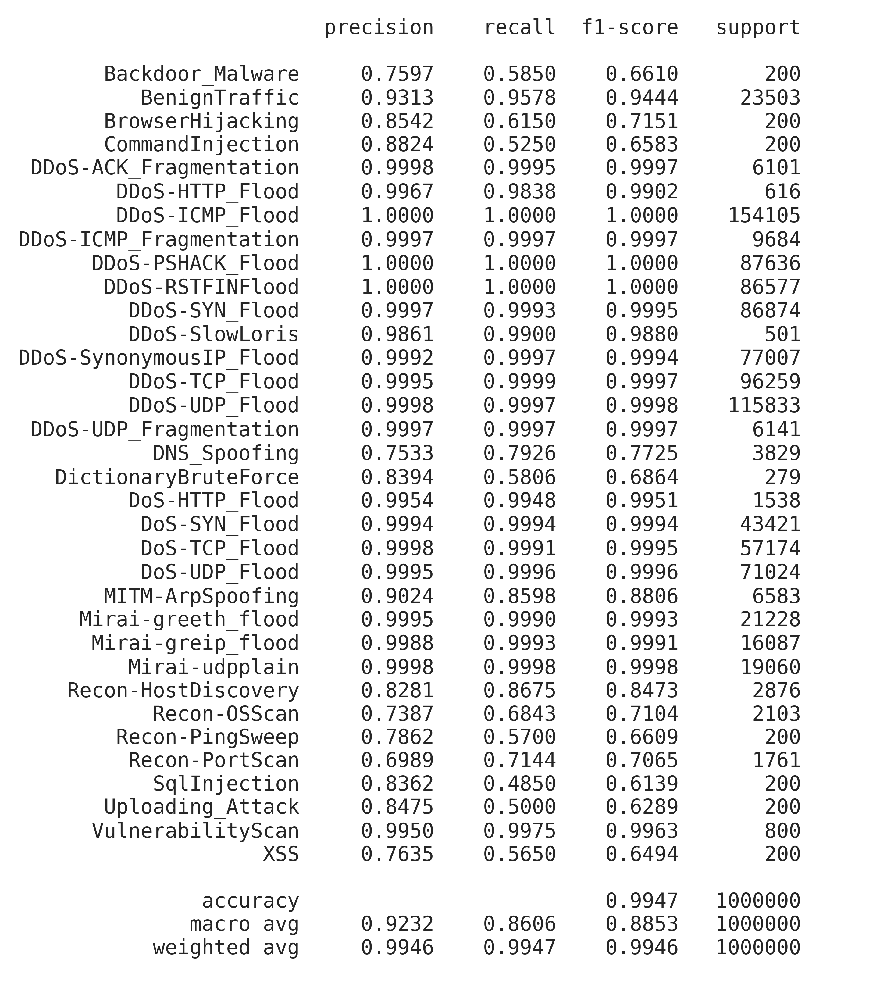

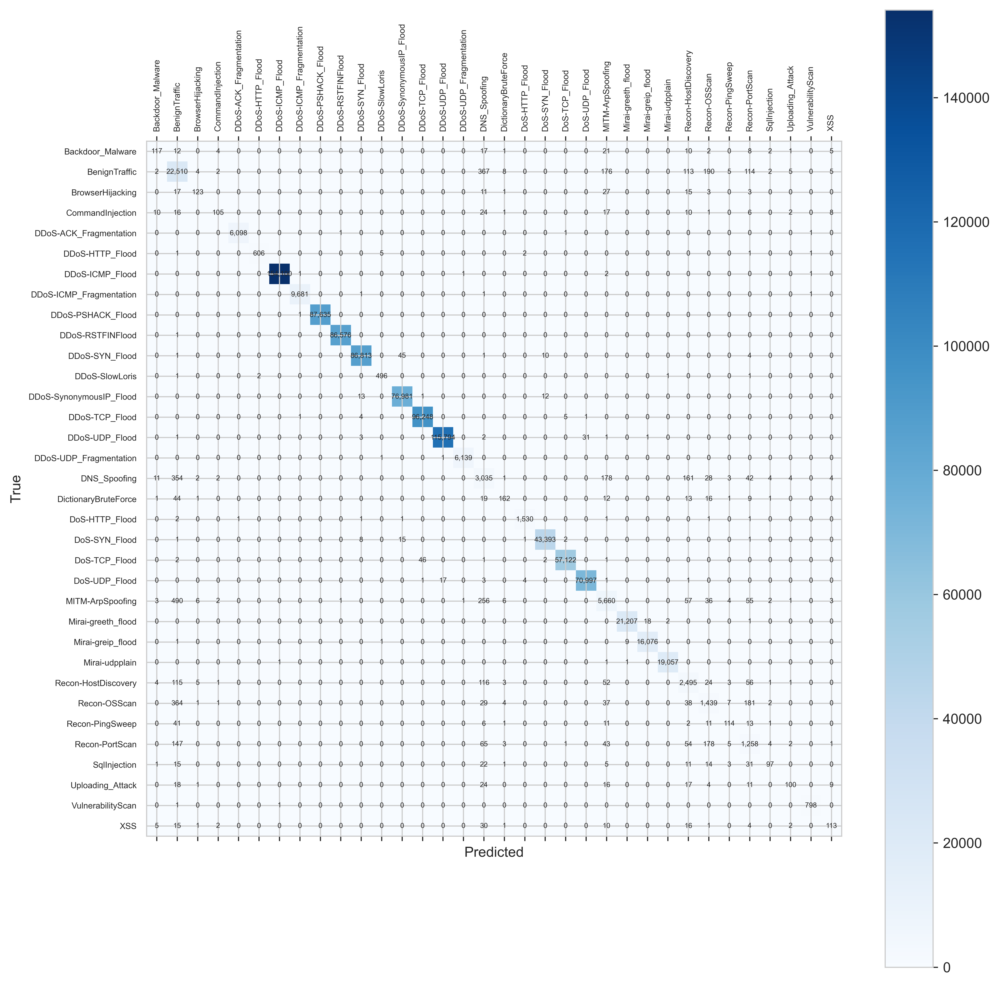

['figures_multi\\xgb_multi_model.pkl']

In [9]:
clf_xgb = xgb.XGBClassifier(
    device='cuda',
    predictor='gpu_predictor',
    n_estimators=500,
    learning_rate=0.1,
    max_depth=10,
    use_label_encoder=False,
    eval_metric="mlogloss",
    random_state=RANDOM_STATE
)

clf_xgb.fit(
    X_train, y_train,
    sample_weight=wts,
    eval_set=[(X_test, y_test)],
    verbose=50
)

y_pred = clf_xgb.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print("XGBoost Accuracy:", acc)
report = classification_report(y_test, y_pred, target_names=classes, digits=4)
print(report)

# save classification report image and confusion matrix image
save_classification_report_as_image(report, "xgboost_multi")
cm = confusion_matrix(y_test, y_pred)
save_confusion_matrix(cm, "xgboost_multi", classes, cmap="Blues")

# Save model
joblib.dump(clf_xgb, os.path.join(SAVE_DIR, 'xgb_multi_model.pkl'))


# ### 6.2 CatBoost

0:	learn: 1.9671325	test: 1.0631154	best: 1.0631154 (0)	total: 572ms	remaining: 4m 45s
50:	learn: 0.5224395	test: 0.0890290	best: 0.0890290 (50)	total: 26s	remaining: 3m 49s
100:	learn: 0.3586729	test: 0.0672815	best: 0.0672815 (100)	total: 50.9s	remaining: 3m 21s
150:	learn: 0.2737797	test: 0.0585434	best: 0.0585434 (150)	total: 1m 15s	remaining: 2m 55s
200:	learn: 0.2163104	test: 0.0512047	best: 0.0512047 (200)	total: 1m 41s	remaining: 2m 30s
250:	learn: 0.1835613	test: 0.0471076	best: 0.0471076 (250)	total: 2m 5s	remaining: 2m 4s
300:	learn: 0.1610825	test: 0.0439038	best: 0.0439038 (300)	total: 2m 30s	remaining: 1m 39s
350:	learn: 0.1413377	test: 0.0421581	best: 0.0421581 (350)	total: 2m 55s	remaining: 1m 14s
400:	learn: 0.1268229	test: 0.0402280	best: 0.0402280 (400)	total: 3m 20s	remaining: 49.5s
450:	learn: 0.1153355	test: 0.0389637	best: 0.0389637 (450)	total: 3m 45s	remaining: 24.5s
499:	learn: 0.1061204	test: 0.0379309	best: 0.0379309 (499)	total: 4m 9s	remaining: 0us
bestTes

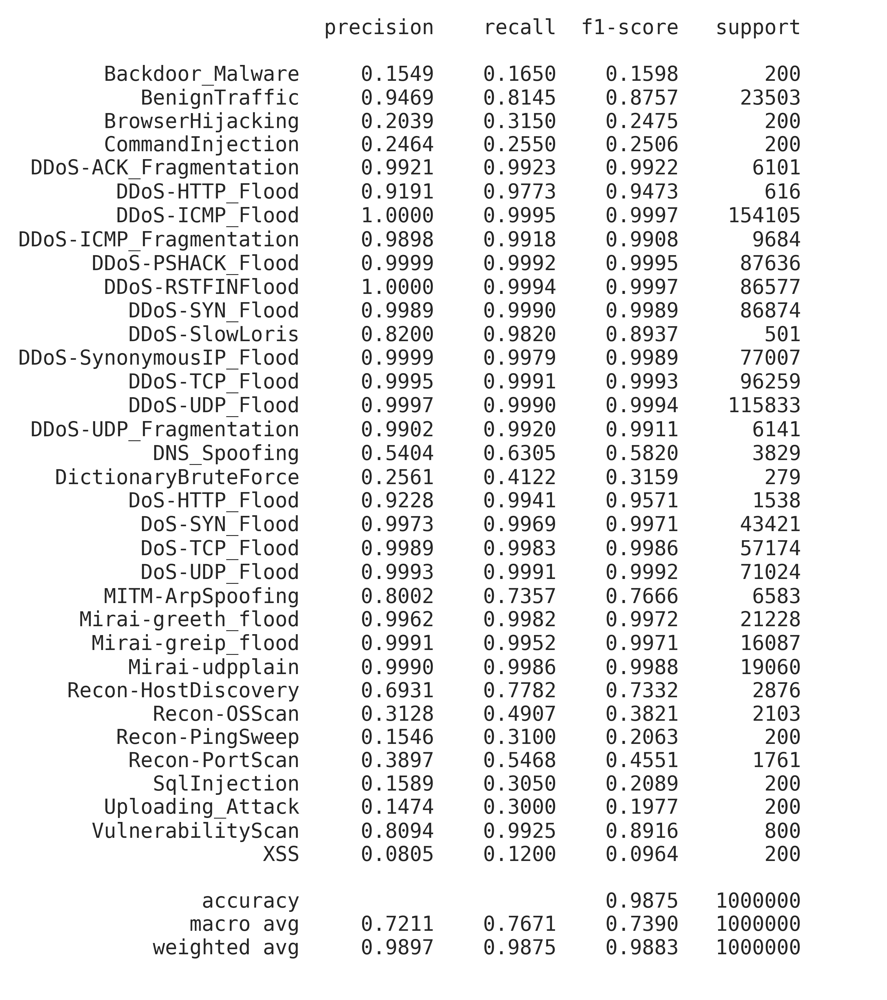

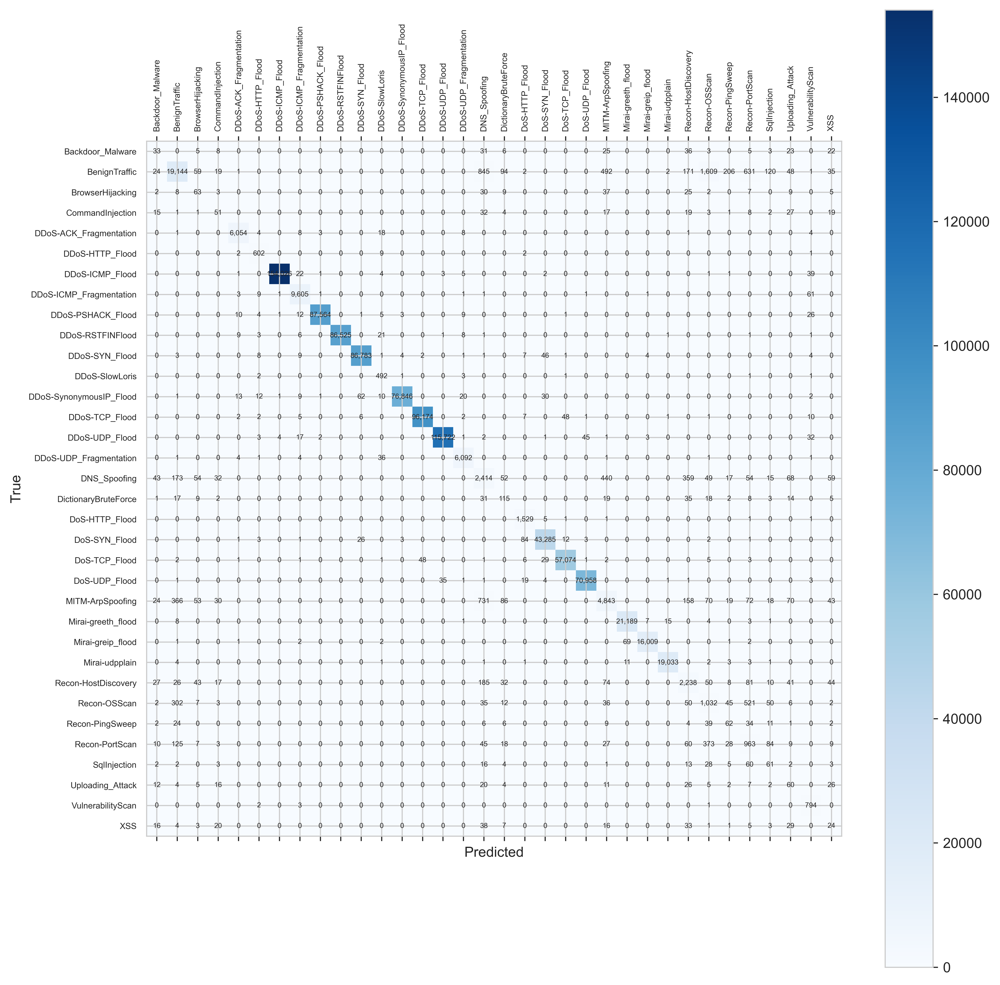

['figures_multi\\cat_multi_model.pkl']

In [10]:
clf_cat = CatBoostClassifier(
    iterations=500,
    learning_rate=0.1,
    depth=10,
    loss_function='MultiClass',
    eval_metric='MultiClass',
    task_type='GPU',
    random_seed=RANDOM_STATE,
    verbose=50
)
clf_cat.fit(
    X_train, y_train,
    sample_weight=wts,
    eval_set=(X_test, y_test),
    early_stopping_rounds=20
)

y_pred = clf_cat.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print("CatBoost Accuracy:", acc)
report = classification_report(y_test, y_pred, target_names=classes, digits=4)
print(report)

save_classification_report_as_image(report, "catboost_multi")
cm = confusion_matrix(y_test, y_pred)
save_confusion_matrix(cm, "catboost_multi", classes, cmap="Blues")

joblib.dump(clf_cat, os.path.join(SAVE_DIR, 'cat_multi_model.pkl'))

# ## 7. Inference latency benchmarking (no figures; printed numbers)

In [12]:
def measure_inference_latency(model, X):
    _ = model.predict(X[:1])
    start = time.perf_counter()
    _ = model.predict(X)
    end = time.perf_counter()
    total_ms = (end - start) * 1000
    avg_ms = total_ms / X.shape[0]
    return total_ms, avg_ms


models = [
    (clf_xgb, "XGBoost"),
    (clf_cat, "CatBoost"),
]

for model, name in models:
    total_ms, avg_ms = measure_inference_latency(model, X_test)
    print(f"{name}: total = {total_ms:.2f} ms, per sample = {avg_ms:.4f} ms")

XGBoost: total = 4012.21 ms, per sample = 0.0040 ms


C:\Users\ss160\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\ss160\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


LightGBM: total = 14532.68 ms, per sample = 0.0145 ms
CatBoost: total = 3808.78 ms, per sample = 0.0038 ms
